# Alligator Analysis

Let's try this again.

- [ ] Recover the original values (actual level of dimorphism)
- [ ] See how the recovery value changes over the sample size
- [ ] See how the recovery does when you change the effect size

In [1]:
library(ggplot2)
library(FSA) # for the vbStart function to find good parameters for the von Bertalanffy function
library(minpack.lm) # a more robust version of nls for non-linear curve fitting to avoid problems with e.g. very small sample sizes
library(rstan)
library(viridis)

custom_theme <- function() {
  theme_minimal() +
    theme(
      panel.background = element_rect(fill = "white"),
      panel.grid.major = element_line(color = alpha("black", 0.5), linetype = "dotted", linewidth = 0.5),
      panel.grid.minor = element_blank(),
      axis.text = element_text(size = 12),  # Adjust the font size of axis labels
      axis.title = element_text(size = 16),  # Adjust the font size of axis titles
      plot.title = element_text(size = 20, hjust = 0.5),  # Adjust the font size and center the plot title
      plot.subtitle = element_text(size = 16, hjust = 0.5)  # Adjust the font size and center the plot subtitle
    )
}
options(repr.plot.width=15, repr.plot.height=8)

# rstan options
options(mc.cores = parallel::detectCores())
rstan_options(auto_write = TRUE)

## FSA v0.9.5. See citation('FSA') if used in publication.
## Run fishR() for related website and fishR('IFAR') for related book.

Loading required package: StanHeaders


rstan version 2.32.3 (Stan version 2.26.1)


For execution on a local, multicore CPU with excess RAM we recommend calling
options(mc.cores = parallel::detectCores()).
To avoid recompilation of unchanged Stan programs, we recommend calling
rstan_options(auto_write = TRUE)
For within-chain threading using `reduce_sum()` or `map_rect()` Stan functions,
change `threads_per_chain` option:
rstan_options(threads_per_chain = 1)


Loading required package: viridisLite



Simplify the model to

$$
\sigma = 0.25
$$

In [2]:
actual_male_params <- list(
    L = 3.79,
    A = 0.94,
    K = 0.0695,
    sigma = 0.25
)
actual_female_params <- list(
    L = 2.78,
    A = 0.91,
    K = 0.0926,
    sigma = 0.25
)

generalized_von_bertalanffy <- function(age, L, A, K) {
    # print(paste("L", L))
    # print(paste("A", A))
    # print(paste("K", K))
    L * (1 - A * exp(-K * age))
}

generate_initial_vb_params <- function(df, debug = FALSE) {
    initial_params_raw <- tryCatch({vbStarts(df$length ~ df$age)},
        error = function(e) {
            if (debug) {
                cat("Error getting initial von Bertalanffy parameters for data", conditionMessage(e))
            }
            NULL
        }
    )

    if (is.null(initial_params_raw)) return(NULL)

    # now convert to my parameterization
    # I use y = Linf * (1 - A e ^ (-Kt) )
    # they use y = Linf * (1 - e^(-K (t - t0)))
    # -> A = e^K t0
    initial_params <- list(
        L = initial_params_raw$Linf,
        K = initial_params_raw$K,
        A = exp(initial_params_raw$K * initial_params_raw$t0)
    )
    initial_params
}

generate_curve_fit <- function(data) {
    start <- generate_initial_vb_params(data)
    fit <- nlsLM(length ~ generalized_von_bertalanffy(age, L, A, K), data = data, start = start)
    fit
}

predict_sex <- function(combined_data, fit = NULL) {
    if (is.null(fit)) {
        fit <- generate_curve_fit(combined_data)
    }
    combined_data$residual <- resid(fit)
    combined_data$predicted_sex <- ifelse(combined_data$residual > 0, "M", "F")
    combined_data
}

generate_male_alligator_mean_lengths <- function(t) {
    3.79 * (1 - 0.94 * exp(-0.0695 * t))
}

generate_male_alligator_sigma <- function(lengths) {
    0.0589 * log(lengths) + 0.0816
}

generate_female_alligator_mean_lengths <- function(t) {
    2.78 * (1 - 0.91 * exp(-0.0926 * t))
}

generate_female_alligator_sigma <- function(lengths) {
    0.0332 * log(lengths) + 0.046
}

generate_alligator_samples <- function(t, sex) {
    if (sex == "M") {
        length_function <- generate_male_alligator_mean_lengths
        sigma_function <- generate_male_alligator_sigma
    } else if (sex == "F") {
        length_function <- generate_female_alligator_mean_lengths
        sigma_function <- generate_female_alligator_sigma
    }
    lengths <- length_function(t)
    sigmas <- sigma_function(lengths)
    rnorm(length(t), mean = lengths, sd = sigmas)
}

ALLIGATOR_MAX_LIFESPAN <- 50
sigma = 0.25

## Figure out what the parameters do

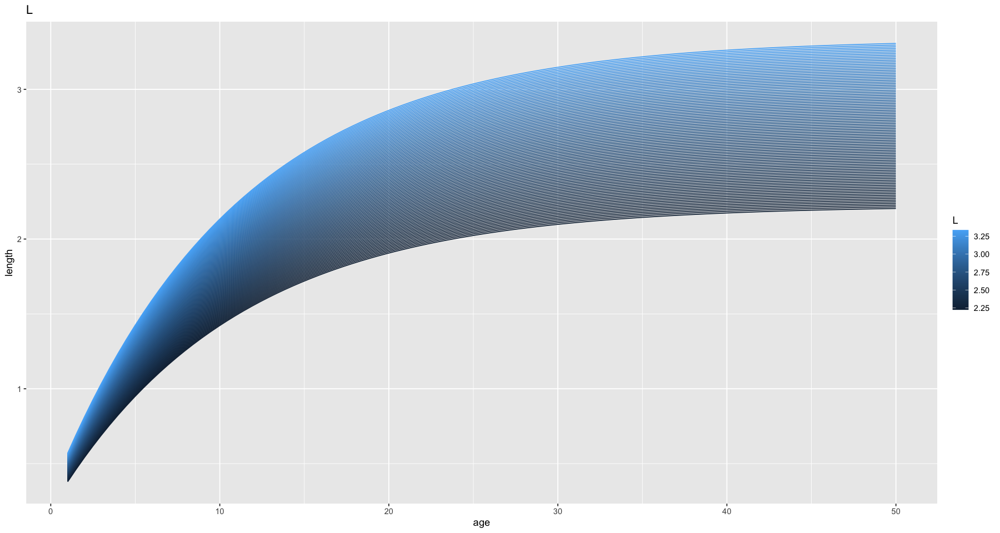

In [5]:
# L
df <- data.frame(
    L = numeric(),
    age = numeric(),
    length = numeric()
)
curve_ages <- seq(1, ALLIGATOR_MAX_LIFESPAN, length.out = 100)
for (L in seq(0.8 * actual_female_params[['L']], 1.2 * actual_female_params[['L']], length.out = 100)) {
    df <- rbind(
        df,
        data.frame(L = L, age = curve_ages, length = generalized_von_bertalanffy(curve_ages, L = L, A = actual_female_params[['A']], K = actual_female_params[['K']]))
    )
}

ggplot(df, aes(age, length, group = L, colour = L)) +
    geom_line() +
    labs(title = "L")

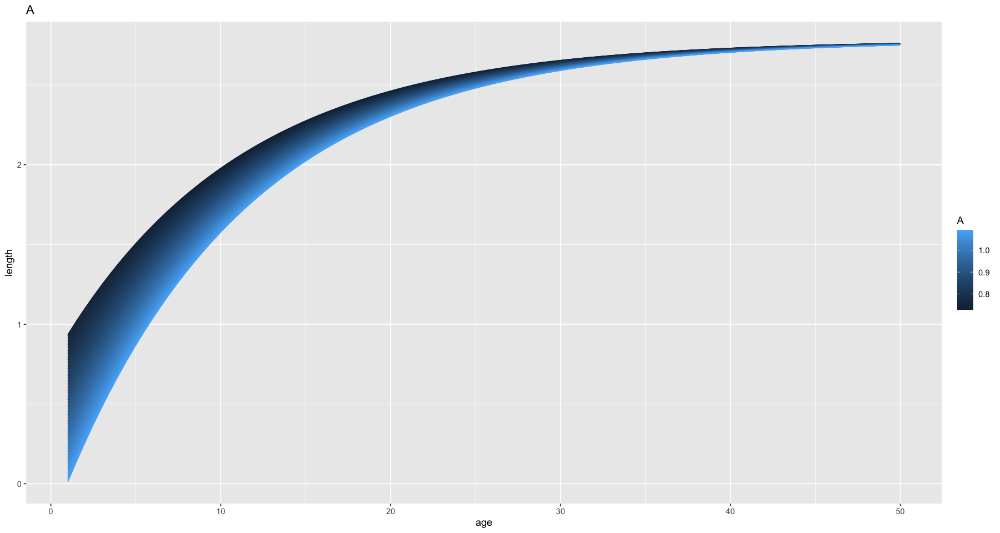

In [7]:
# A
df <- data.frame(
    A = numeric(),
    age = numeric(),
    length = numeric()
)
curve_ages <- seq(1, ALLIGATOR_MAX_LIFESPAN, length.out = 100)
for (A in seq(0.8 * actual_female_params[['A']], 1.2 * actual_female_params[['A']], length.out = 100)) {
    df <- rbind(
        df,
        data.frame(A = A, age = curve_ages, length = generalized_von_bertalanffy(curve_ages, L = actual_female_params[['L']], A = A, K = actual_female_params[['K']]))
    )
}

ggplot(df, aes(age, length, group = A, colour = A)) +
    geom_line() +
    labs(title = "A")

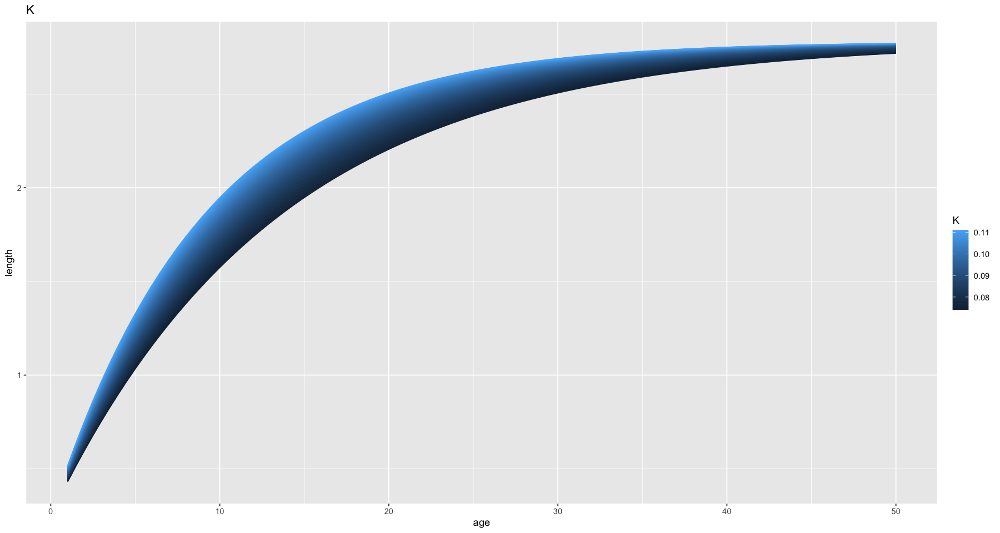

In [8]:
# K
df <- data.frame(
    K = numeric(),
    age = numeric(),
    length = numeric()
)
curve_ages <- seq(1, ALLIGATOR_MAX_LIFESPAN, length.out = 100)
for (K in seq(0.8 * actual_female_params[['K']], 1.2 * actual_female_params[['K']], length.out = 100)) {
    df <- rbind(
        df,
        data.frame(K = K, age = curve_ages, length = generalized_von_bertalanffy(curve_ages, L = actual_female_params[['L']], K = K, A = actual_female_params[['A']]))
    )
}

ggplot(df, aes(age, length, group = K, colour = K)) +
    geom_line() +
    labs(title = "K")

Generate some reasonable priors

In [3]:
generate_generate_alligator_samples <- function(params) {
    function(ages) {
        means <- generalized_von_bertalanffy(ages, L = params[['L']], A = params[["A"]], K = params[['K']])
        rnorm(length(ages), mean = means, sd = params[['sigma']])
    }
}
generate_female_samples <- generate_generate_alligator_samples(actual_female_params)
generate_male_samples <- generate_generate_alligator_samples(actual_male_params)

In [4]:
num_samples <- 1e3
female_ages <- runif(num_samples, 1, ALLIGATOR_MAX_LIFESPAN)
female_lengths <- generate_female_samples(female_ages)
female_data <- data.frame(age = female_ages, length = female_lengths)

In [5]:
prior_L <- c(actual_female_params[['L']], 0.5)
prior_K <- c(actual_female_params[['K']], 0.025)
prior_A <- c(actual_female_params[['A']], 0.25)
prior_sigma <- c(actual_female_params[['sigma']], 0.05)

curve_ages <- seq(1, ALLIGATOR_MAX_LIFESPAN, by = 0.1)
curve_lengths <- generalized_von_bertalanffy(curve_ages, L = actual_female_params[['L']], A = actual_female_params[['A']], K = actual_female_params[['K']])

p <- ggplot() +
    geom_line(data = data.frame(age = curve_ages, length = curve_lengths), mapping = aes(age, length), linewidth = 2) +
    labs(x = "Age (years)", y = "Length (m)", title = "Prior and Actual Growth Curves (females)") +
    custom_theme()

num_samples <- 1e3
sample_df <- data.frame(age = numeric(), length = numeric())
for (i in 1:100) {
    L <- rnorm(1, prior_L[1], prior_L[2])
    K <- rnorm(1, prior_K[1], prior_K[2])
    A <- rnorm(1, prior_A[1], prior_A[2])
    sample_sigma <- rnorm(1, prior_sigma[1], prior_sigma[2])

    mean <- generalized_von_bertalanffy(curve_ages, L = L, A = A, K = K)
    samples <- rnorm(length(curve_ages), mean = mean, sd = sample_sigma)
    sample_df <- rbind(
        sample_df,
        data.frame(age = curve_ages, length = samples)
    )
}

summary_df <- data.frame(age = numeric(), lower = numeric(), upper = numeric())
for (age in curve_ages) {
    relevant <- sample_df[abs(sample_df$age - age) < 0.001, ]
    summary_df <- rbind(
        summary_df,
        data.frame(
            age = age,
            lower = quantile(relevant$length, 0.025),
            upper = quantile(relevant$length, 0.975)
        )
    )
}
p <- p +
    geom_ribbon(data = summary_df, mapping = aes(age, ymin = lower, ymax = upper), alpha = 0.2)

In [6]:
single_model <- "
data {
    int<lower = 0> N; // number of samples
    vector[N] length; // a vector of the lengths
    vector[N] age; // vector of the ages; index correlates with length (so length[i] happened at age[i])

    vector[2] prior_L;
    vector[2] prior_A;
    vector[2] prior_K;
    vector[2] prior_sigma;
}

parameters {
    real<lower=0> L;
    real<lower=0> A;
    real<lower=0> K;
    real<lower=0> sigma;
}

model {
    vector[N] mean_length;

    L ~ normal(prior_L[1], prior_L[2]);
    K ~ normal(prior_K[1], prior_K[2]);
    A ~ normal(prior_A[1], prior_A[2]);
    sigma ~ normal(prior_sigma[1], prior_sigma[2]);
    mean_length = L * (1 - A * exp(-K * age));
    length ~ normal(mean_length, sigma);
}
"

In [7]:
data <- list(
    N = nrow(female_data),
    length = female_data$length,
    age = female_data$age,
    prior_L = prior_L,
    prior_A = prior_A,
    prior_K = prior_K,
    prior_sigma = prior_sigma
)
model.single <- stan(model_code = single_model, data = data)
model.single

Inference for Stan model: anon_model.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

        mean se_mean   sd   2.5%    25%    50%    75%  97.5% n_eff Rhat
L       2.78    0.00 0.02   2.75   2.77   2.78   2.79   2.81  1918    1
A       0.91    0.00 0.02   0.88   0.90   0.91   0.92   0.94  1955    1
K       0.09    0.00 0.00   0.09   0.09   0.09   0.09   0.10  1639    1
sigma   0.25    0.00 0.01   0.24   0.24   0.25   0.25   0.26  2498    1
lp__  892.31    0.04 1.45 888.55 891.63 892.65 893.36 894.09  1582    1

Samples were drawn using NUTS(diag_e) at Sat Feb 10 07:22:19 2024.
For each parameter, n_eff is a crude measure of effective sample size,
and Rhat is the potential scale reduction factor on split chains (at 
convergence, Rhat=1).

In [8]:
samples <- extract(model.single)

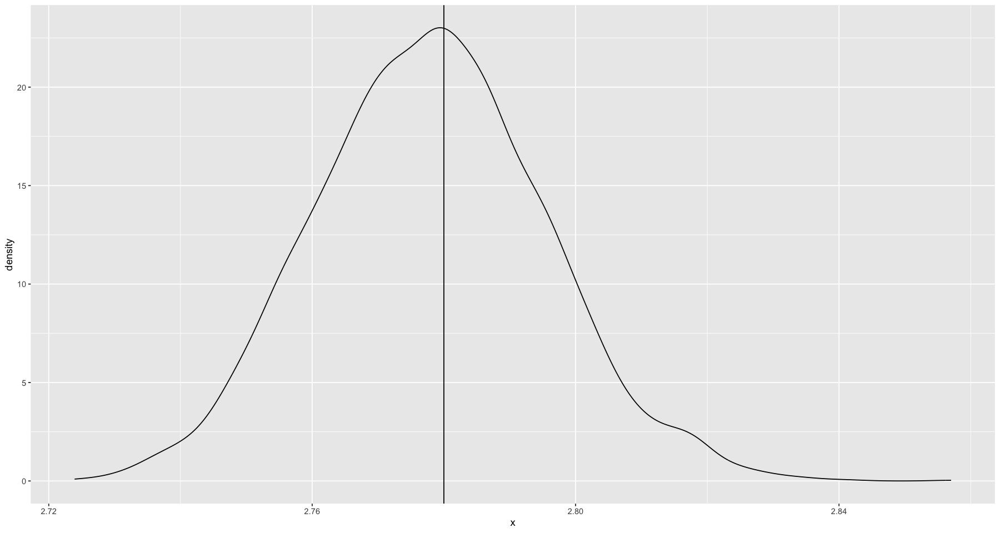

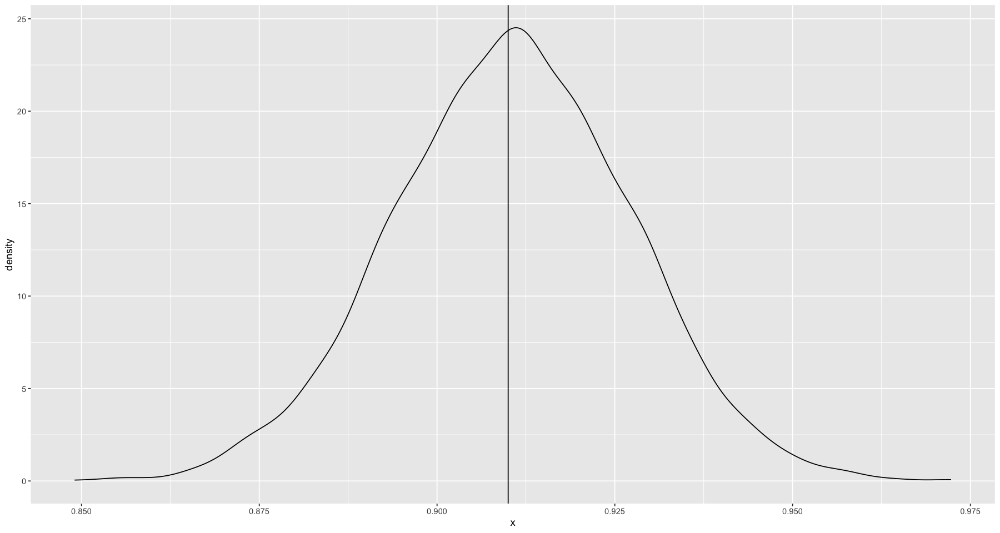

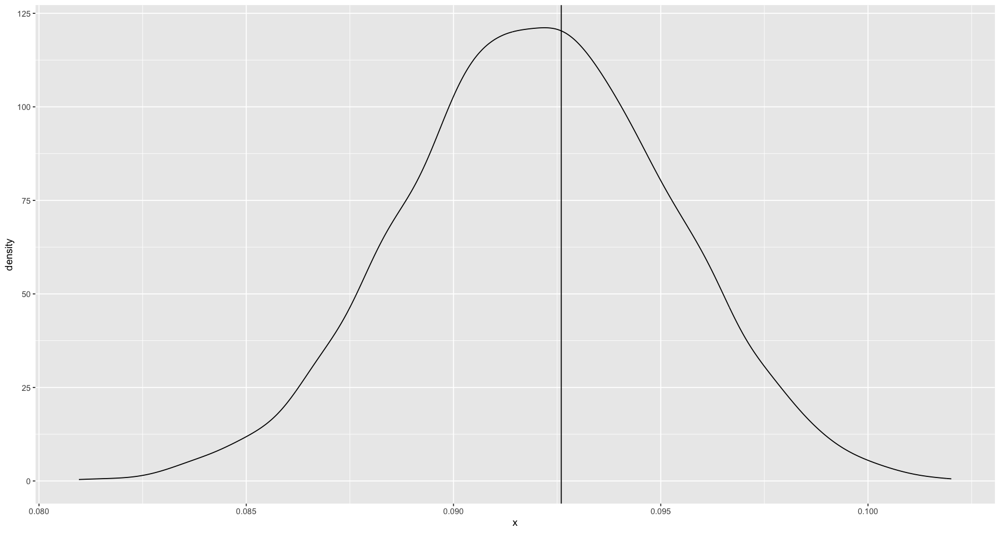

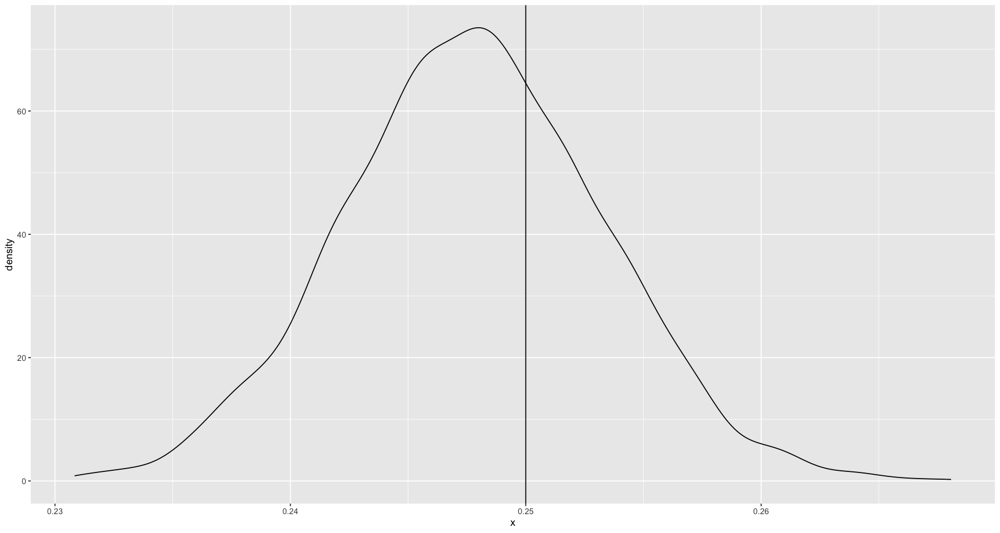

In [9]:
for (param in c('L', 'A', 'K', 'sigma')) {
    p <- ggplot(data.frame(x = samples[[param]]), aes(x)) +
        geom_density(aes(y = after_stat(density))) +
        geom_vline(xintercept = actual_female_params[[param]])
    print(p)
}

## Model with Each
- [ ] Correct sexes
- [ ] Predicted sexes

In [16]:
num_samples <- 1e3
male_ages <- runif(num_samples, 1, ALLIGATOR_MAX_LIFESPAN)
male_sample <- generate_male_samples(male_ages)
female_ages <- runif(num_samples, 1, ALLIGATOR_MAX_LIFESPAN)
female_sample <- generate_female_samples(female_ages)
combined_data <- data.frame(
    age = c(male_ages, female_ages),
    length = c(male_sample, female_sample),
    sex = rep(c("M", "F"), each = num_samples)
)
combined_data <- combined_data[combined_data$length > 0, ]

In [17]:
population_fit <- generate_curve_fit(combined_data)
population_params <- coef(population_fit)

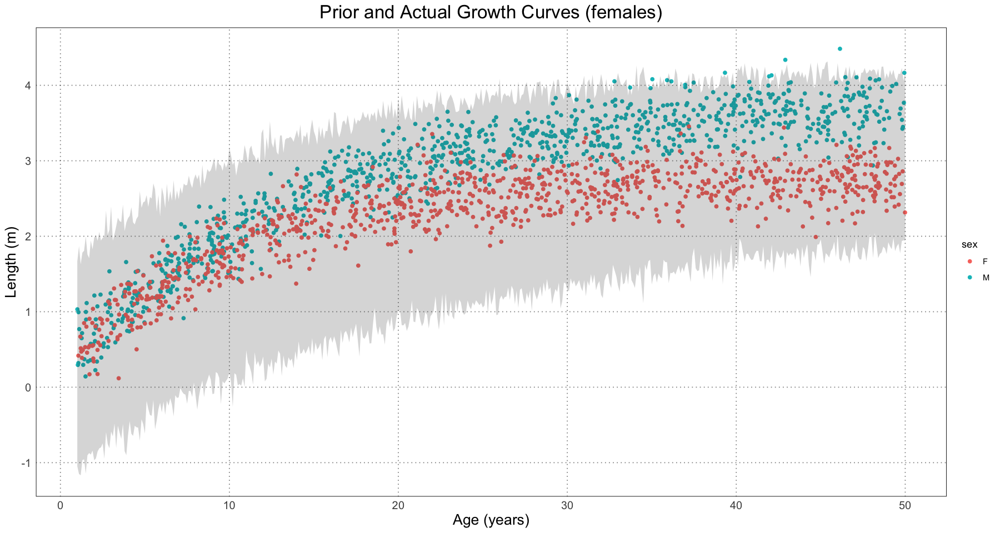

In [18]:
# prior
prior_L <- c(population_params[['L']], 0.5)
prior_K <- c(population_params[['K']], 0.025)
prior_A <- c(population_params[['A']], 0.25)
prior_sigma <- c(sigma, 0.05)

p <- ggplot() +
    geom_point(data = combined_data, mapping = aes(age, length, colour = sex, group = sex)) +
    labs(x = "Age (years)", y = "Length (m)", title = "Prior and Actual Growth Curves (females)") +
    custom_theme()

num_samples <- 1e3
sample_df <- data.frame(age = numeric(), length = numeric())
for (i in 1:100) {
    L <- rnorm(1, prior_L[1], prior_L[2])
    K <- rnorm(1, prior_K[1], prior_K[2])
    A <- rnorm(1, prior_A[1], prior_A[2])
    sample_sigma <- rnorm(1, prior_sigma[1], prior_sigma[2])

    mean <- generalized_von_bertalanffy(curve_ages, L = L, A = A, K = K)
    samples <- rnorm(length(curve_ages), mean = mean, sd = sample_sigma)
    sample_df <- rbind(
        sample_df,
        data.frame(age = curve_ages, length = samples)
    )
}

summary_df <- data.frame(age = numeric(), lower = numeric(), upper = numeric())
for (age in curve_ages) {
    relevant <- sample_df[abs(sample_df$age - age) < 0.001, ]
    summary_df <- rbind(
        summary_df,
        data.frame(
            age = age,
            lower = quantile(relevant$length, 0.025),
            upper = quantile(relevant$length, 0.975)
        )
    )
}
p <- p +
    geom_ribbon(data = summary_df, mapping = aes(age, ymin = lower, ymax = upper), alpha = 0.2)
p

In [19]:
vb_dimorphism_model <- "
functions {
    vector vonBertalanffy(vector age, real L, real A, real K) {
        int N = size(age);
        vector[N] means = L * (1 - A * exp(-K * age));
        return means;
    }
    vector orZero(vector v) {
        int N = size(v);
        vector[N] newV;
        for (i in 1:N) {
            if (v[i] <= 0) {
                newV[i] = 0;
            } else {
                newV[i] = v[i];
            }
        }
        return newV;
    }
}
data {
    // male data
    int<lower = 0> N_male; // number of samples
    vector<lower=0>[N_male] age_male; // vector of the ages; index correlates with length (so length[i] happened at age[i])
    vector<lower=0>[N_male] length_male; // a vector of the lengths

    // female data
    int<lower = 0> N_female;
    vector<lower=0>[N_female] age_female;
    vector<lower=0>[N_female] length_female;

    // population data
    // prior data (mean and standard deviation)
    vector[2] prior_L;
    vector[2] prior_A;
    vector[2] prior_K;
    vector[2] prior_sigma;
}

parameters {
    real<lower=0> L_male;
    real<lower=0> A_male;
    real<lower=0> K_male;
    real<lower=0> sigma_male;

    real<lower=0> L_female;
    real<lower=0> A_female;
    real<lower=0> K_female;
    real<lower=0> sigma_female;
}

model {
    vector[N_male] mean_length_male;
    vector[N_male] sd_length_male;
    vector[N_female] mean_length_female;
    vector[N_female] sd_length_female;

    // male part of the model
    L_male ~ normal(prior_L[1], prior_L[2]);
    K_male ~ normal(prior_K[1], prior_K[2]);
    A_male ~ normal(prior_A[1], prior_A[2]);
    sigma_male ~ normal(prior_sigma[1], prior_sigma[2]);
    mean_length_male = vonBertalanffy(age_male, L_male, A_male, K_male);
    length_male ~ normal(mean_length_male, sigma_male);

    // female part of the model
    L_female ~ normal(prior_L[1], prior_L[2]);
    K_female ~ normal(prior_K[1], prior_K[2]);
    A_female ~ normal(prior_A[1], prior_A[2]);
    sigma_female ~ normal(prior_sigma[1], prior_sigma[2]);
    mean_length_female = vonBertalanffy(age_female, L_female, A_female, K_female);
    length_female ~ normal(mean_length_female, sigma_female);
}

generated quantities {
    real diff;
    diff = L_male - L_female;
}
"

In [20]:
male_data <- subset(combined_data, sex == "M")
female_data <- subset(combined_data, sex == "F")
data <- list(
        N_male = nrow(male_data),
        age_male = male_data$age,
        length_male = male_data$length,
        N_female = nrow(female_data),
        age_female = female_data$age,
        length_female = female_data$length,
        prior_L = prior_L,
        prior_A = prior_A,
        prior_K = prior_K,
        prior_sigma = prior_sigma
    )
sample_size_model <- stan(model_code = vb_dimorphism_model, data = data, iter = 8000)
sample_size_model

Inference for Stan model: anon_model.
4 chains, each with iter=8000; warmup=4000; thin=1; 
post-warmup draws per chain=4000, total post-warmup draws=16000.

                mean se_mean   sd    2.5%     25%     50%     75%   97.5% n_eff
L_male          3.79    0.00 0.03    3.74    3.78    3.79    3.81    3.85  9135
A_male          0.93    0.00 0.01    0.91    0.93    0.93    0.94    0.95  9435
K_male          0.07    0.00 0.00    0.07    0.07    0.07    0.07    0.07  7742
sigma_male      0.25    0.00 0.01    0.24    0.25    0.25    0.26    0.27 16893
L_female        2.77    0.00 0.02    2.74    2.76    2.77    2.78    2.80 10491
A_female        0.93    0.00 0.02    0.90    0.92    0.93    0.95    0.97 10454
K_female        0.10    0.00 0.00    0.09    0.09    0.10    0.10    0.10  8724
sigma_female    0.25    0.00 0.01    0.24    0.25    0.25    0.26    0.26 18410
diff            1.02    0.00 0.03    0.96    1.00    1.02    1.04    1.08  9113
lp__         1731.48    0.02 2.00 1726.80 1

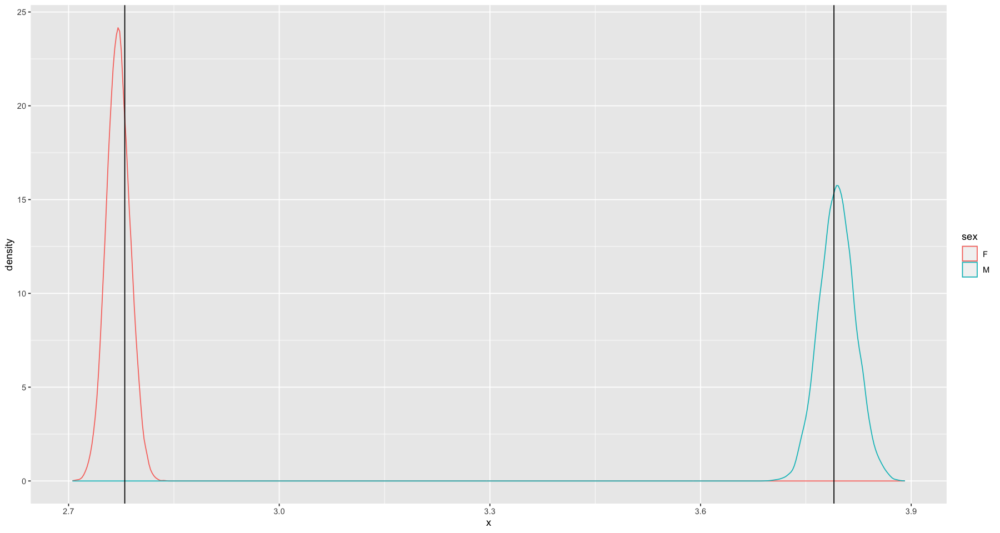

In [21]:
samples <- extract(sample_size_model)

L_params <- rbind(
    data.frame(x = samples[['L_female']], sex = "F"),
    data.frame(x = samples[['L_male']], sex = "M")
)

ggplot(L_params, aes(x, group = sex, colour = sex)) +
    geom_density(aes(y = after_stat(density))) +
    geom_vline(xintercept = actual_male_params[['L']]) +
    geom_vline(xintercept = actual_female_params[['L']])

Great, now with the predicted sex

In [22]:
fit.population <- generate_curve_fit(combined_data)
combined_data <- predict_sex(combined_data, fit = fit.population)
population_params <- coef(fit.population)

In [23]:
male_data <- subset(combined_data, predicted_sex == "M")
female_data <- subset(combined_data, predicted_sex == "F")
data <- list(
        N_male = nrow(male_data),
        age_male = male_data$age,
        length_male = male_data$length,
        N_female = nrow(female_data),
        age_female = female_data$age,
        length_female = female_data$length,
        prior_L = prior_L,
        prior_A = prior_A,
        prior_K = prior_K,
        prior_sigma = prior_sigma
    )
sample_size_model <- stan(model_code = vb_dimorphism_model, data = data, iter = 8000)
sample_size_model

Inference for Stan model: anon_model.
4 chains, each with iter=8000; warmup=4000; thin=1; 
post-warmup draws per chain=4000, total post-warmup draws=16000.

                mean se_mean   sd    2.5%     25%     50%     75%   97.5% n_eff
L_male          3.80    0.00 0.02    3.76    3.78    3.80    3.81    3.84  9023
A_male          0.87    0.00 0.01    0.85    0.86    0.87    0.87    0.89 10130
K_male          0.07    0.00 0.00    0.07    0.07    0.07    0.07    0.07  7754
sigma_male      0.21    0.00 0.00    0.20    0.21    0.21    0.21    0.22 18716
L_female        2.77    0.00 0.01    2.75    2.76    2.77    2.78    2.80 10250
A_female        1.00    0.00 0.01    0.98    0.99    1.00    1.01    1.03  9437
K_female        0.09    0.00 0.00    0.09    0.09    0.09    0.10    0.10  8035
sigma_female    0.21    0.00 0.00    0.20    0.21    0.21    0.21    0.22 18399
diff            1.03    0.00 0.03    0.97    1.01    1.03    1.04    1.08  9316
lp__         2107.92    0.02 2.00 2103.12 2

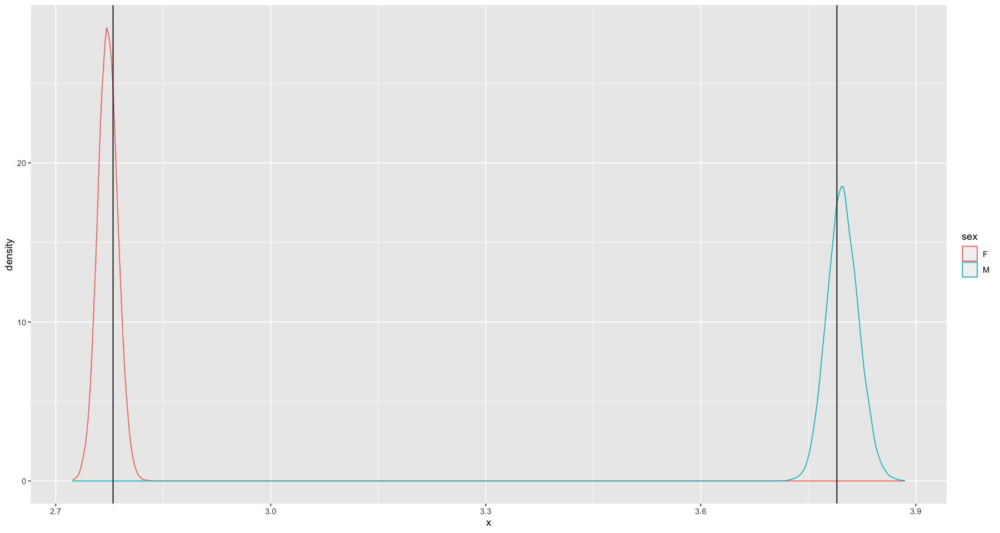

In [24]:
samples <- extract(sample_size_model)

L_params <- rbind(
    data.frame(x = samples[['L_female']], sex = "F"),
    data.frame(x = samples[['L_male']], sex = "M")
)

ggplot(L_params, aes(x, group = sex, colour = sex)) +
    geom_density(aes(y = after_stat(density))) +
    geom_vline(xintercept = actual_male_params[['L']]) +
    geom_vline(xintercept = actual_female_params[['L']])

Now the predicted and actual difference

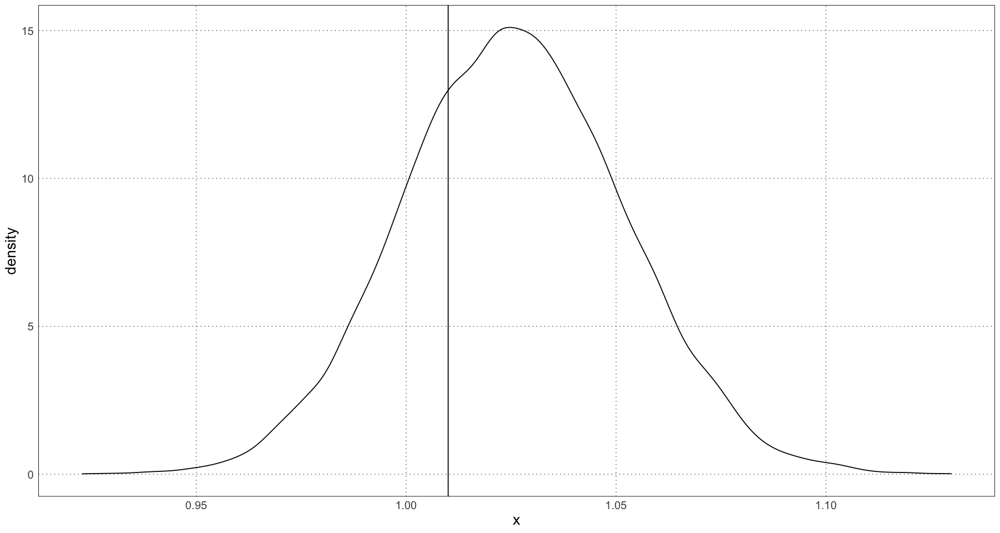

In [25]:
difference_df <- data.frame(x = samples[['diff']])

ggplot(difference_df, aes(x)) +
    geom_density(aes(y = after_stat(density))) +
    geom_vline(xintercept = actual_male_params[['L']] - actual_female_params[['L']]) +
    custom_theme()


## How does the difference change with sample size?

In [26]:
sample_sizes <- c(5, 10, 20, 50, 100)
sample_df <- data.frame(sample_size = integer(), diff = numeric())
for (sample_size in sample_sizes) {
    male_ages <- runif(sample_size, 1, ALLIGATOR_MAX_LIFESPAN)
    male_length <- generate_male_samples(male_ages)
    female_ages <- runif(sample_size, 1, ALLIGATOR_MAX_LIFESPAN)
    female_length <- generate_female_samples(female_ages)
    combined_data <- data.frame(
        age = c(male_ages, female_ages),
        length = c(male_length, female_length),
        sex = rep(c("M", "F"), each = num_samples)
    )
    population_fit <- generate_curve_fit(combined_data)
    population_params <- coef(population_fit)
    prior_L <- c(population_params[['L']], 0.5)
    prior_K <- c(population_params[['K']], 0.025)
    prior_A <- c(population_params[['A']], 0.25)
    prior_sigma <- c(sigma, 0.05)
    combined_data <- predict_sex(combined_data, fit = population_fit)
    male_data <- subset(combined_data, predicted_sex == "M")
    female_data <- subset(combined_data, predicted_sex == "F")

    data <- list(
            N_male = nrow(male_data),
            age_male = male_data$age,
            length_male = male_data$length,
            N_female = nrow(female_data),
            age_female = female_data$age,
            length_female = female_data$length,
            prior_L = prior_L,
            prior_A = prior_A,
            prior_K = prior_K,
            prior_sigma = prior_sigma
        )
    model <- stan(model_code = vb_dimorphism_model, data = data, iter = 8000)
    samples <- extract(model)
    sample_df <- rbind(
        sample_df,
        data.frame(sample_size = sample_size * 2, diff = samples[['diff']])
    )
}
head(sample_df)


Warning message:
“There were 235 divergent transitions after warmup. See
https://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup
to find out why this is a problem and how to eliminate them.”
Warning message:
“There were 4 chains where the estimated Bayesian Fraction of Missing Information was low. See
https://mc-stan.org/misc/warnings.html#bfmi-low”
Warning message:
“Examine the pairs() plot to diagnose sampling problems
”
Warning message:
“The largest R-hat is 4.03, indicating chains have not mixed.
Running the chains for more iterations may help. See
https://mc-stan.org/misc/warnings.html#r-hat”
Warning message:
“Bulk Effective Samples Size (ESS) is too low, indicating posterior means and medians may be unreliable.
Running the chains for more iterations may help. See
https://mc-stan.org/misc/warnings.html#bulk-ess”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may be unreliable.
Running the chains f

,sample_size,diff
,<dbl>,<dbl>
1,10,4.303256
2,10,4.303257
3,10,4.303250
4,10,4.303250
5,10,4.303257
6,10,4.303257


In [27]:
alpha <- 0.05
summary_df <- data.frame(
    sample_size = integer(),
    mean = numeric(),
    lower = numeric(),
    upper = numeric()
)

for (sample_size in unique(sample_df$sample_size)) {
    relevant <- sample_df[abs(sample_df$sample_size - sample_size) < 0.001, ]
    sample_mean <- mean(relevant$diff)
    bounds <- quantile(relevant$diff, c(alpha / 2, 1 - alpha / 2))
    summary_df <- rbind(
        summary_df,
        data.frame(sample_size = sample_size, mean = sample_mean, lower = bounds[1], upper = bounds[2])
    )
}
head(summary_df)

,sample_size,mean,lower,upper
,<dbl>,<dbl>,<dbl>,<dbl>
2.5%,10,2.3198208,-0.3973878,4.3032566
2.5%1,20,0.8664437,0.8381616,0.8963650
2.5%2,40,0.7099694,0.6778789,0.7418462
2.5%3,100,1.0165011,0.9575650,1.0769343
2.5%4,200,1.0663737,1.0084236,1.1259588


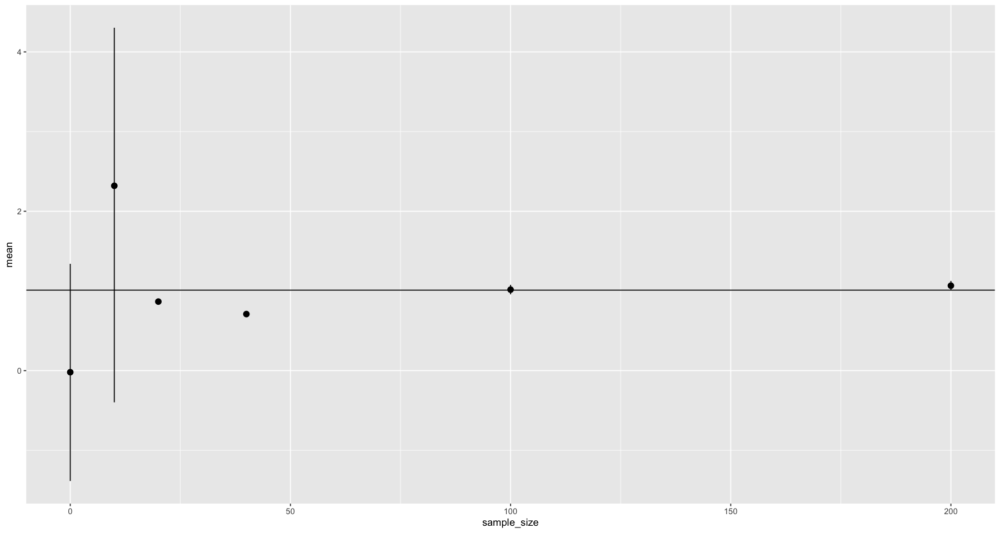

In [28]:
zero_sample <- rnorm(8000, 0, sqrt(2) * prior_L[2])
zero_mean <- mean(zero_sample)
bounds <- quantile(zero_sample, c(alpha / 2, 1 - alpha / 2))

summary_df <- rbind(
    summary_df,
    data.frame(sample_size = 0, mean = zero_mean, lower = bounds[1], upper = bounds[2])
)
actual_diff <- actual_male_params[['L']] - actual_female_params[['L']]
ggplot(summary_df, aes(sample_size, mean)) +
    geom_pointrange(aes(ymin = lower, ymax = upper)) +
    geom_hline(yintercept = actual_diff)

## Magnitude of dimorphism

Here let's see how the magnitude of dimorphism changes our ability to detect it.

In [29]:
generate_fake_male_params <- function(E) {
    list(
        L = actual_female_params[['L']] + E * (actual_male_params[['L']] - actual_female_params[['L']]),
        A = actual_female_params[['A']] + E * (actual_male_params[['A']] - actual_female_params[['A']]),
        K = actual_female_params[['K']] + E * (actual_male_params[['K']] - actual_female_params[['K']]),
        sigma = actual_female_params[['sigma']] + E * (actual_male_params[['sigma']] - actual_female_params[['sigma']])
    )
}

generate_predicted_sex <- function(combined_data, fit = NULL) {
    if (is.null(fit)) {
        fit <- generate_curve_fit(combined_data)
    }
    residuals <- resid(fit)
    ifelse(residuals < 0, "F", "M")
}

In [101]:
num_samples <- 1e3 / 2
effect_sizes <- seq(0, 2, length.out = 10)
# effect_sizes <- seq(0, 2, length.out = 5)
# effect_sizes <- c(1)
sample_df <- data.frame(E = numeric(), sample_diff = numeric(), actual_diff = numeric(), sex_prediction_accuracy = numeric())
for (E in effect_sizes) {
    # generate the fake males
    fake_male_params <- generate_fake_male_params(E)
    generate_fake_male_sample <- generate_generate_alligator_samples(fake_male_params)
    
    # samples
    female_age <- runif(num_samples, 1, ALLIGATOR_MAX_LIFESPAN)
    female_length <- generate_female_samples(female_age)
    male_age <- runif(num_samples, 1, ALLIGATOR_MAX_LIFESPAN)
    male_length <- generate_fake_male_sample(male_age)
    combined_data <- data.frame(
        age = c(female_age, male_age),
        length = c(female_length, male_length),
        sex = rep(c("F", "M"), each = num_samples)
    )
    combined_data <- subset(combined_data, length > 0)

    population_fit <- generate_curve_fit(combined_data)
    population_params <- coef(population_fit)

    prior_L <- c(population_params[['L']], 0.5)
    prior_K <- c(population_params[['K']], 0.025)
    prior_A <- c(population_params[['A']], 0.25)
    prior_sigma <- c(sigma, 0.05)
    
    combined_data$predicted_sex <- generate_predicted_sex(combined_data, fit = population_fit)
    male_data <- subset(combined_data, predicted_sex == "M")
    female_data <- subset(combined_data, predicted_sex == "F")
    sex_prediction_accuracy <- sum(combined_data$sex == combined_data$predicted_sex) / nrow(combined_data)

    # p <- ggplot(combined_data, aes(age, length)) +
    #     geom_point(aes(colour = sex)) +
    #     # geom_point(data = subset(combined_data, sex != predicted_sex), colour = 'red', shape = 21, size = 5) +
    #     labs(title = sprintf("E = %f, sex prediction accuracy = %f", E, sex_prediction_accuracy))
    # print(p)

    data <- list(
            N_male = nrow(male_data),
            age_male = male_data$age,
            length_male = male_data$length,
            N_female = nrow(female_data),
            age_female = female_data$age,
            length_female = female_data$length,
            prior_L = prior_L,
            prior_A = prior_A,
            prior_K = prior_K,
            prior_sigma = prior_sigma
        )
    model <- stan(model_code = vb_dimorphism_model, data = data, iter = 8000)
    samples <- extract(model)
    sample_df <- rbind(
        sample_df,
        data.frame(E = E, sample_diff = samples[['diff']], actual_diff = fake_male_params[['L']] - actual_female_params[['L']],
        sex_prediction_accuracy = sex_prediction_accuracy
        )
    )
}

In [102]:
unique(sample_df$actual_diff)

[1] 0.0000000 0.2244444 0.4488889 0.6733333 0.8977778 1.1222222 1.3466667
 [8] 1.5711111 1.7955556 2.0200000

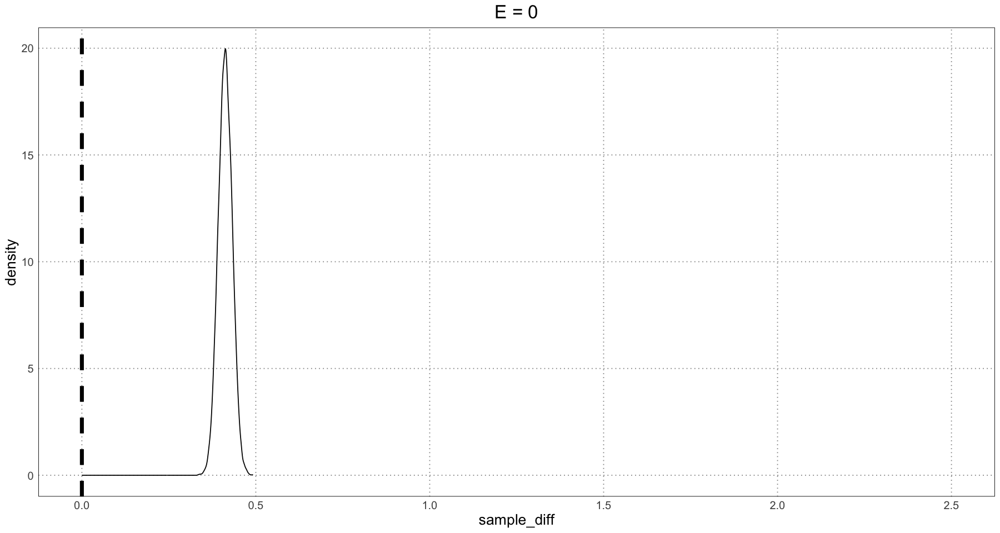

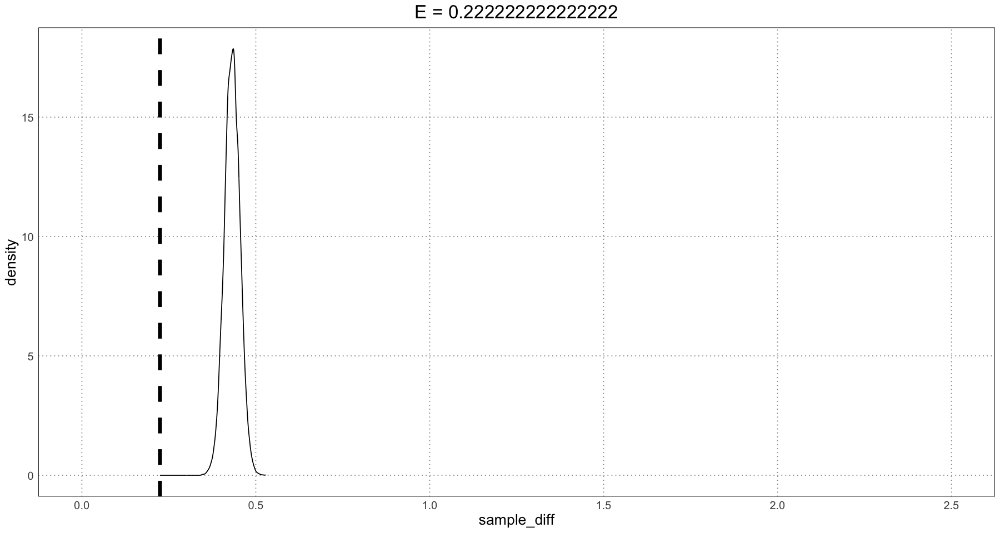

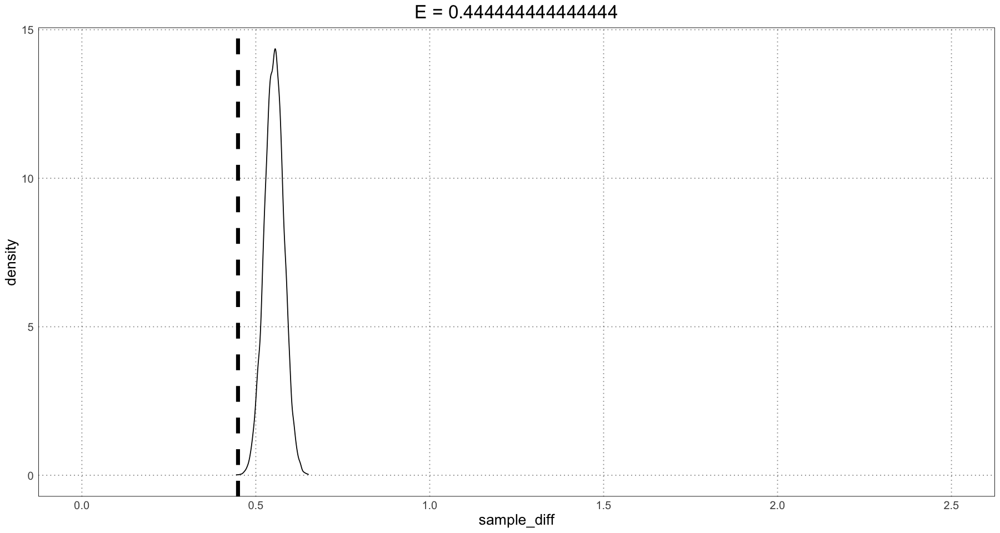

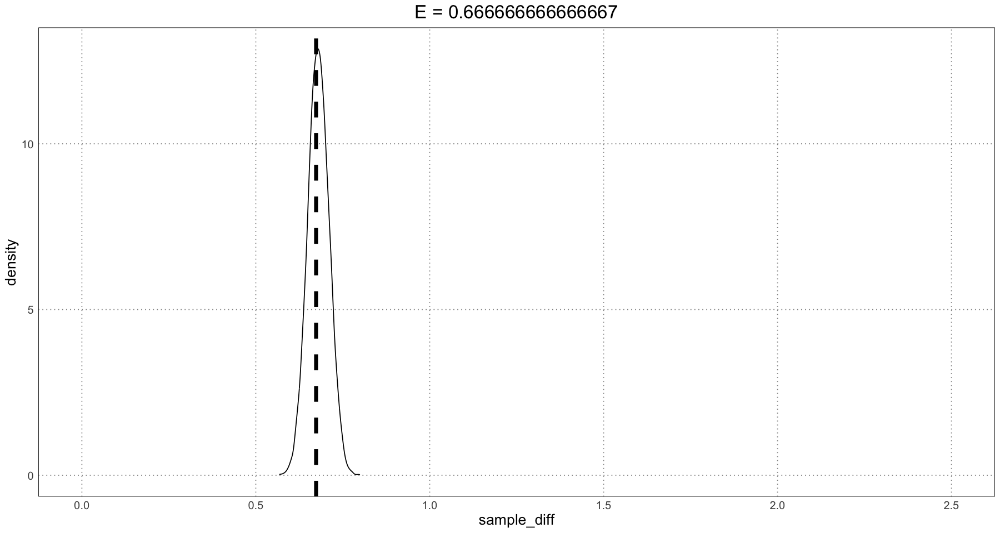

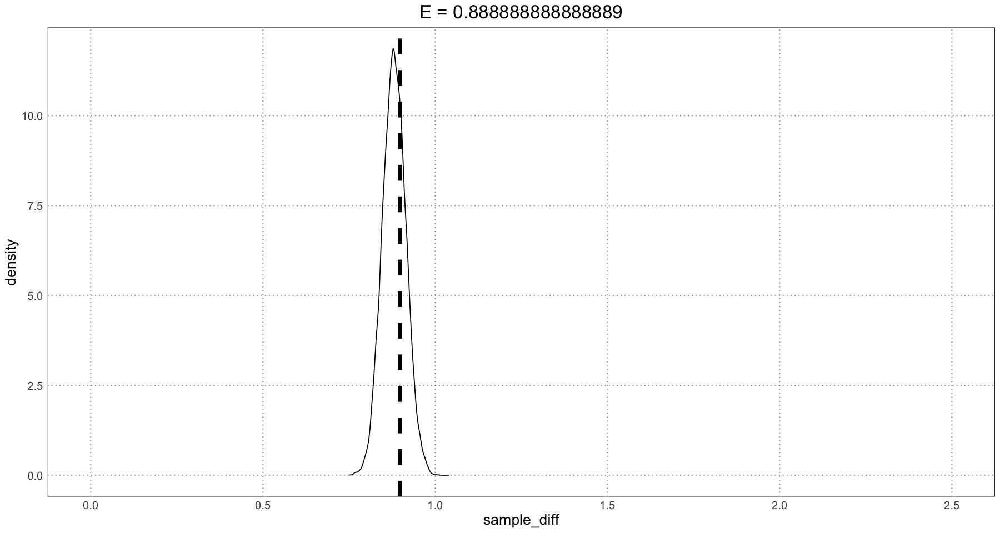

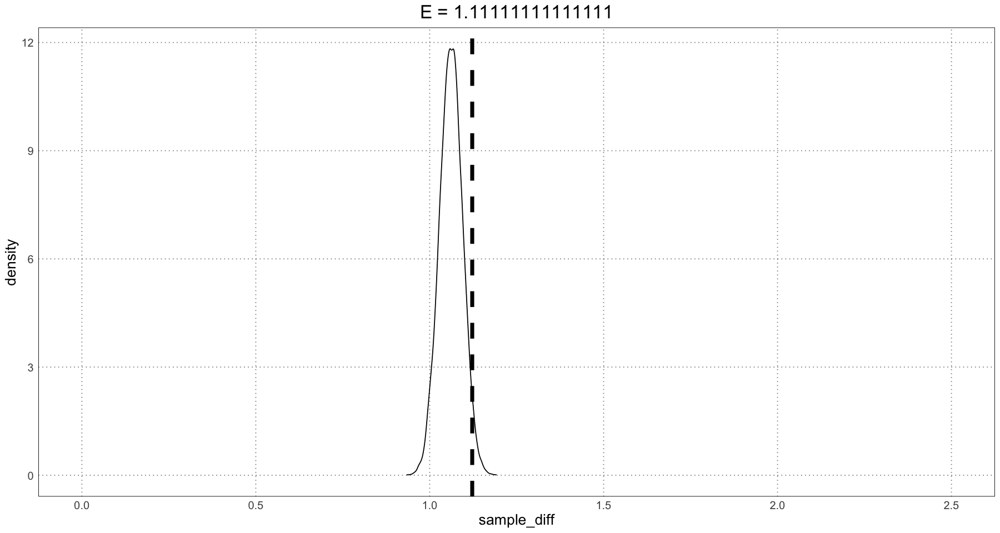

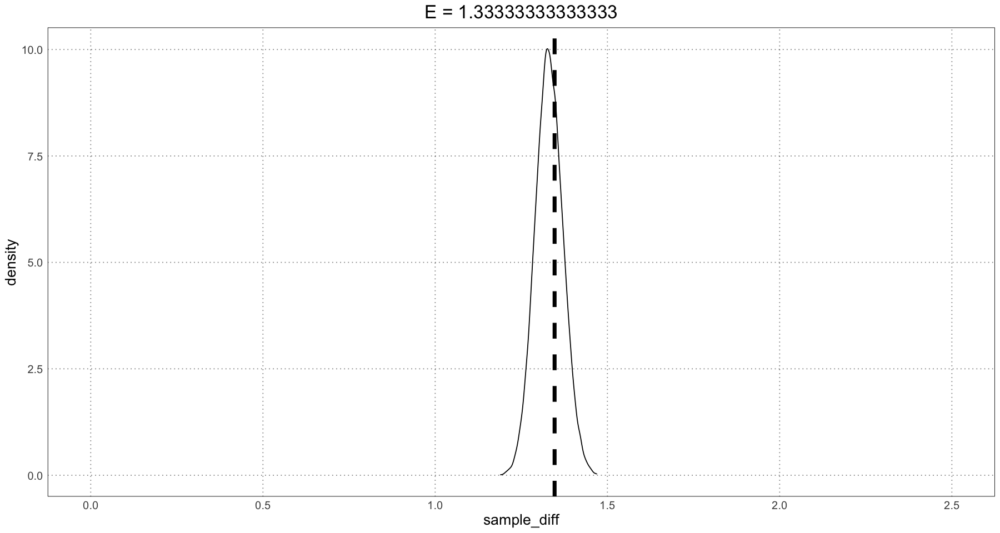

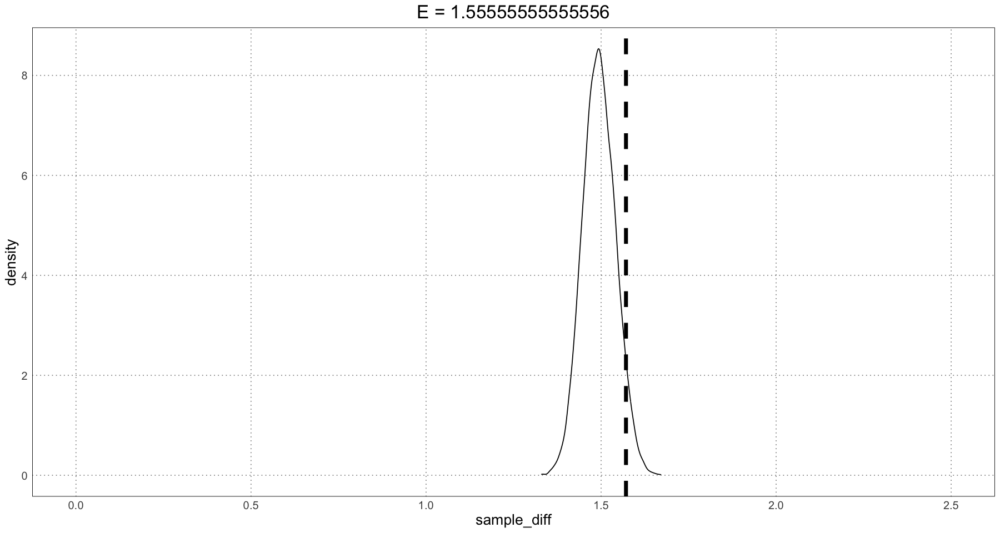

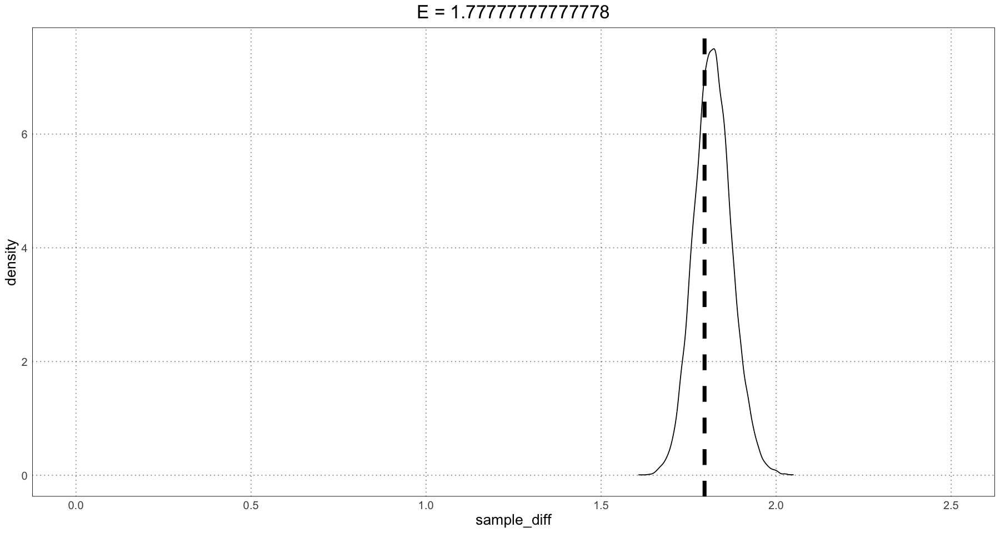

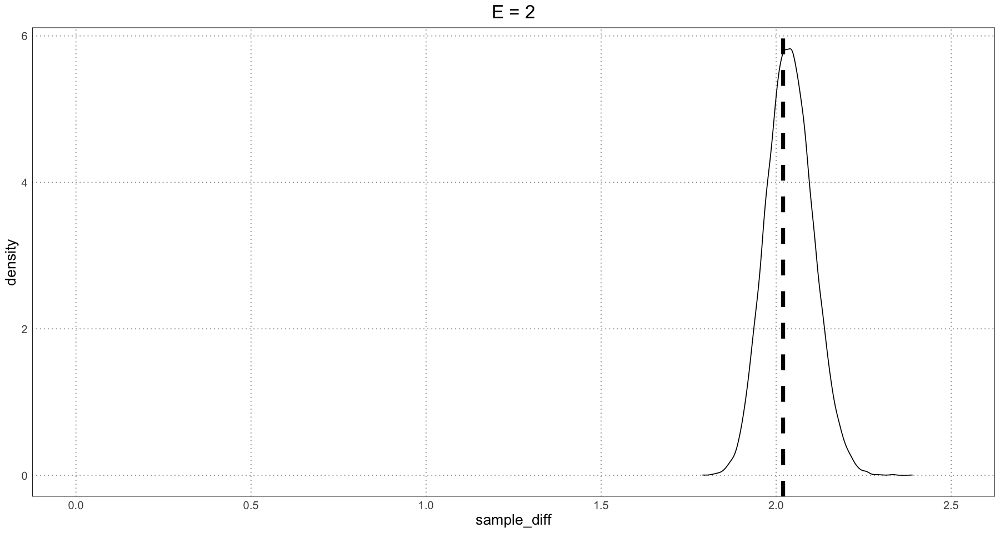

In [103]:
for (E in unique(sample_df$E)) {
    relevant <- sample_df[abs(sample_df$E - E) < 0.00001, ]
    # print(relevant$actual_diff)
    actual_diff_at_E <- unique(relevant$actual_diff)
    p <- ggplot(relevant, aes(sample_diff)) +
        geom_density(aes(y = after_stat(density))) +
        geom_vline(xintercept = actual_diff_at_E, linewidth = 2, linetype = 'dashed') +
        labs(title = paste("E =", E)) +
        coord_cartesian(xlim = c(0, 2.5)) +
        custom_theme()
    print(p)
}

Or, let's look at this another way: error by effect size.

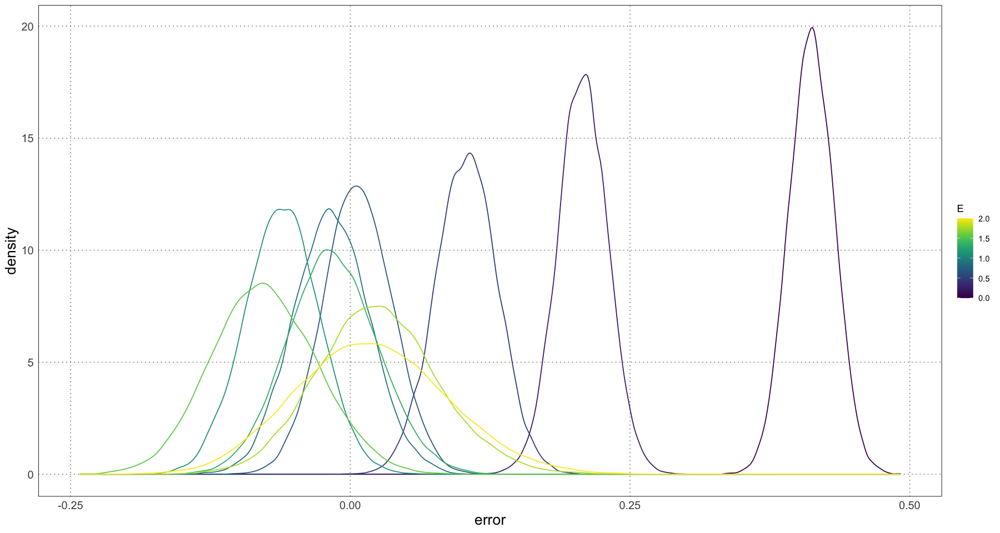

In [104]:
sample_df$error <- sample_df$sample_diff - sample_df$actual_diff

ggplot(sample_df, aes(error, group = E, colour = E)) +
    geom_density(aes(y = after_stat(density))) +
    custom_theme() +
    scale_color_viridis()

We can also see if this correlates to the error in the sex prediction.

In [111]:
error_by_error_df <- data.frame(
    E = numeric(),
    mean_error = numeric(),
    lower = numeric(),
    upper = numeric(),
    sex_prediction_accuracy = numeric()
)
for (E in unique(sample_df$E)) {
    relevant <- sample_df[abs(sample_df$E - E) < 0.000001, ]
    mean_error <- mean(relevant$error)
    bounds <- quantile(relevant$error, c(alpha / 2, 1 - alpha / 2))
    sex_prediction_accuracy <- sum(sample_df$sex == sample_df$predicted_sex)
    error_by_error_df <- rbind(
        error_by_error_df,
        data.frame(
            E = E,
            mean_error = mean_error,
            lower = bounds[1],
            upper = bounds[2],
            sex_prediction_accuracy = unique(relevant$sex_prediction_accuracy)
        )
    )
}
error_by_error_df

,E,mean_error,lower,upper,sex_prediction_accuracy
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2.5%,0.0000000,0.412184406,0.37332604,0.451318119,0.5120000
2.5%1,0.2222222,0.207592096,0.16342472,0.251110866,0.6030000
2.5%2,0.4444444,0.103791931,0.04931341,0.157934203,0.7410000
2.5%3,0.6666667,0.006785413,-0.05304605,0.067135011,0.7770000
2.5%4,0.8888889,-0.016824185,-0.08202293,0.050600416,0.8220000
2.5%5,1.1111111,-0.061082105,-0.12629962,0.003553182,0.8270000
2.5%6,1.3333333,-0.015907969,-0.09362056,0.064536177,0.8510000
2.5%7,1.5555556,-0.076733514,-0.16561713,0.017402266,0.8520000
2.5%8,1.7777778,0.024223415,-0.07760539,0.134706789,0.8590000


`geom_smooth()` using formula = 'y ~ x'


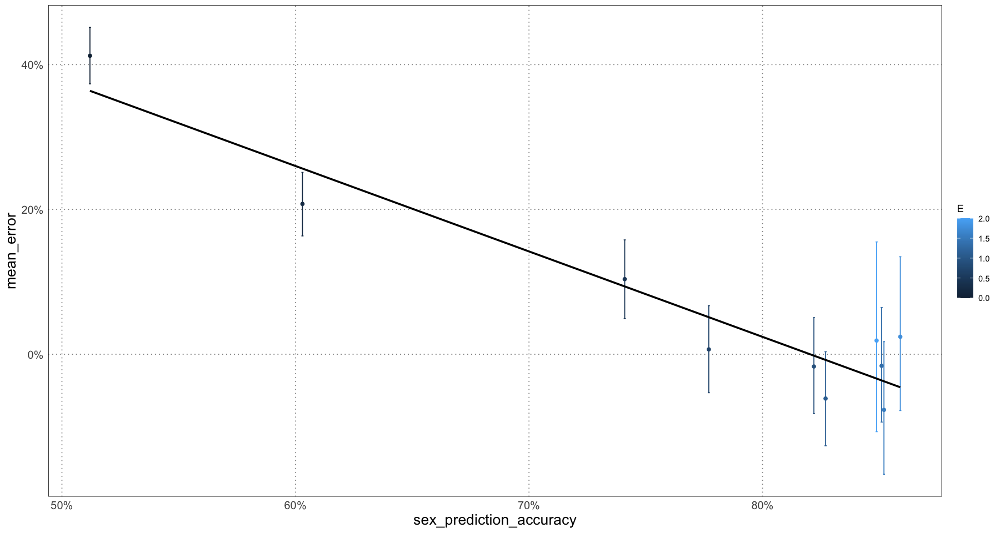

In [120]:
ggplot(error_by_error_df, aes(sex_prediction_accuracy, mean_error, colour = E)) +
    geom_point() +
    geom_errorbar(aes(ymin = lower, ymax = upper)) +
    geom_smooth(method = 'lm', se = FALSE, colour = 'black') +
    scale_y_continuous(labels = scales::percent) +
    scale_x_continuous(labels = scales::percent) +
    custom_theme()

## Effect of Magnitude of Dimorphsim on Naive Sex Assigment Accuracy

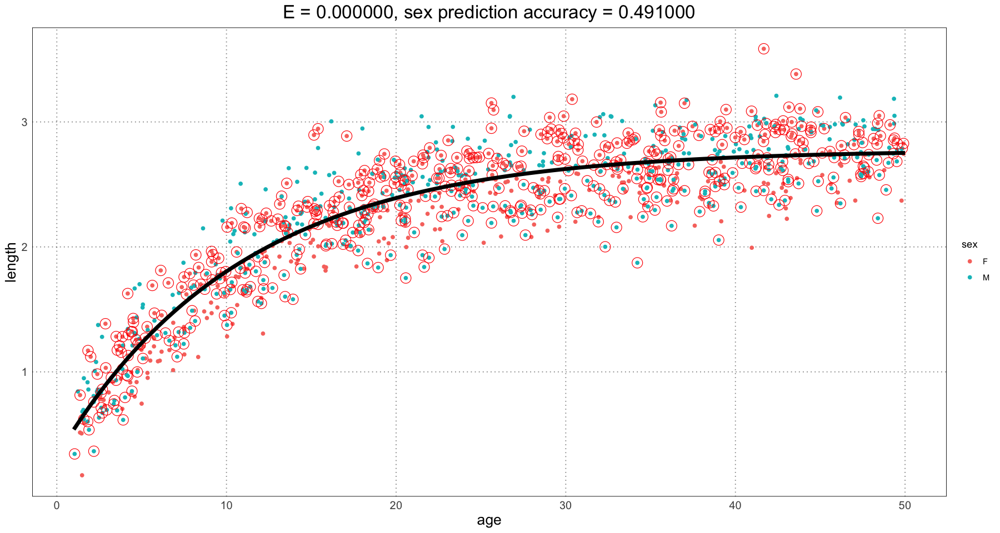

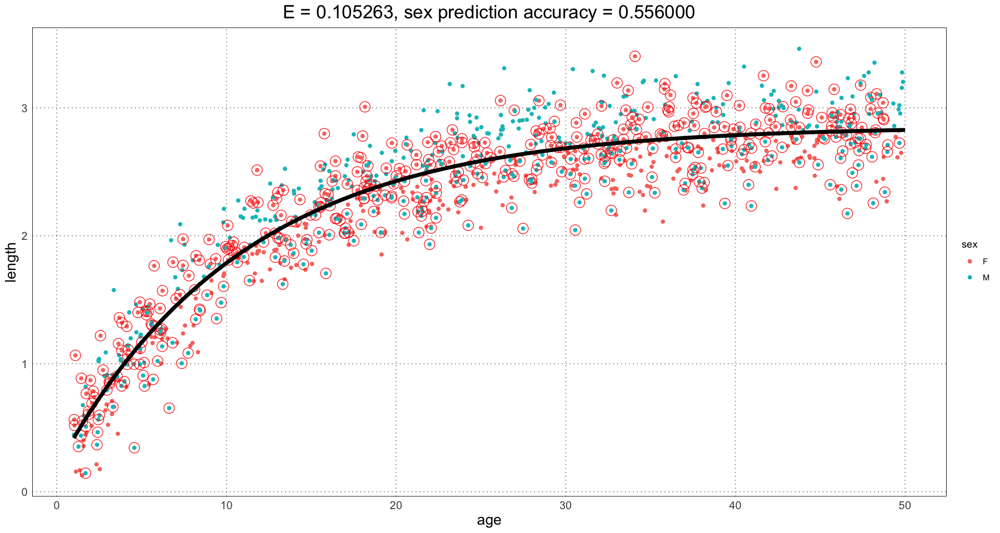

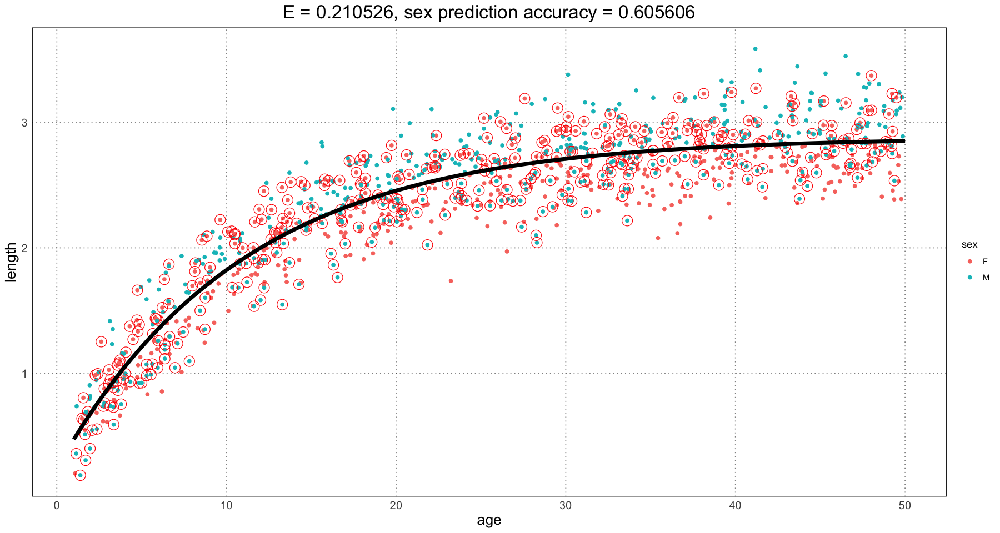

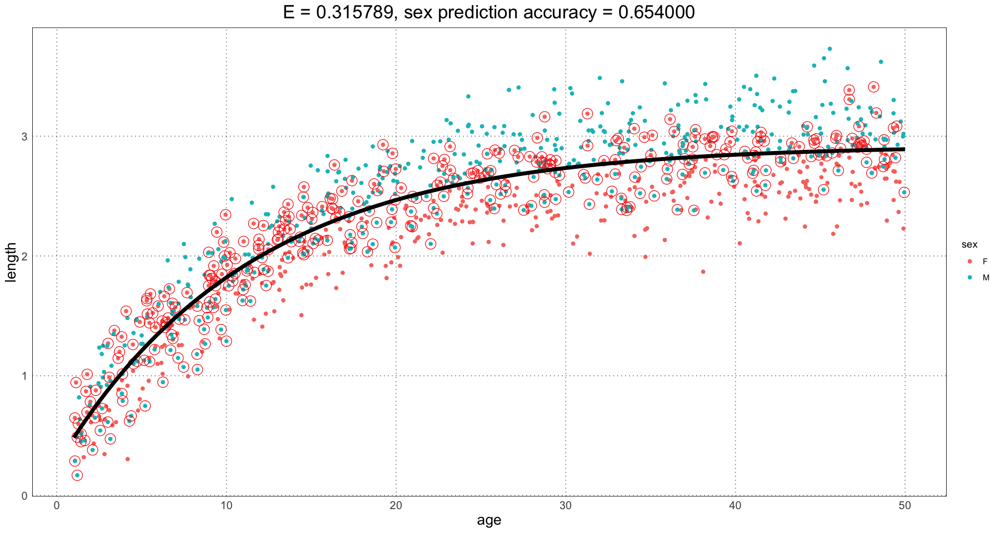

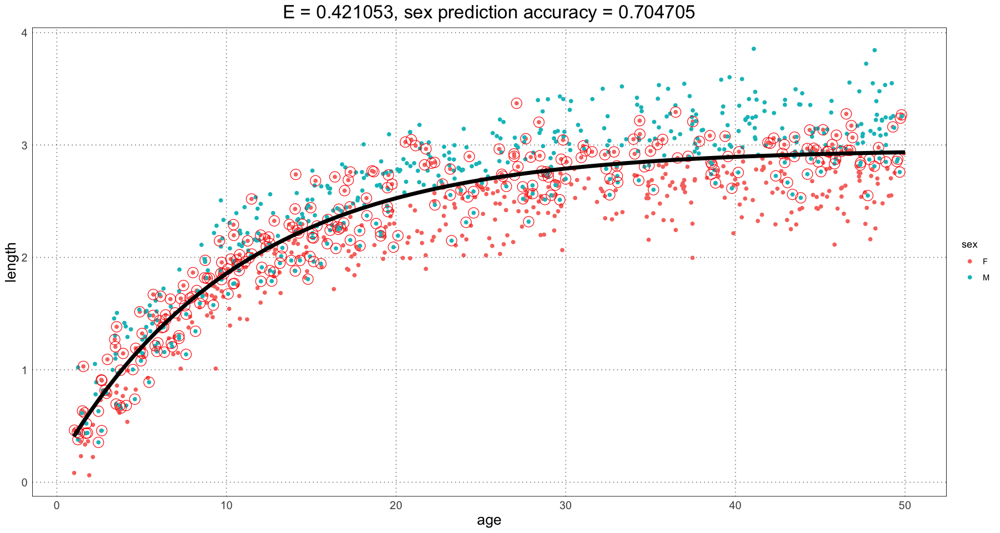

...

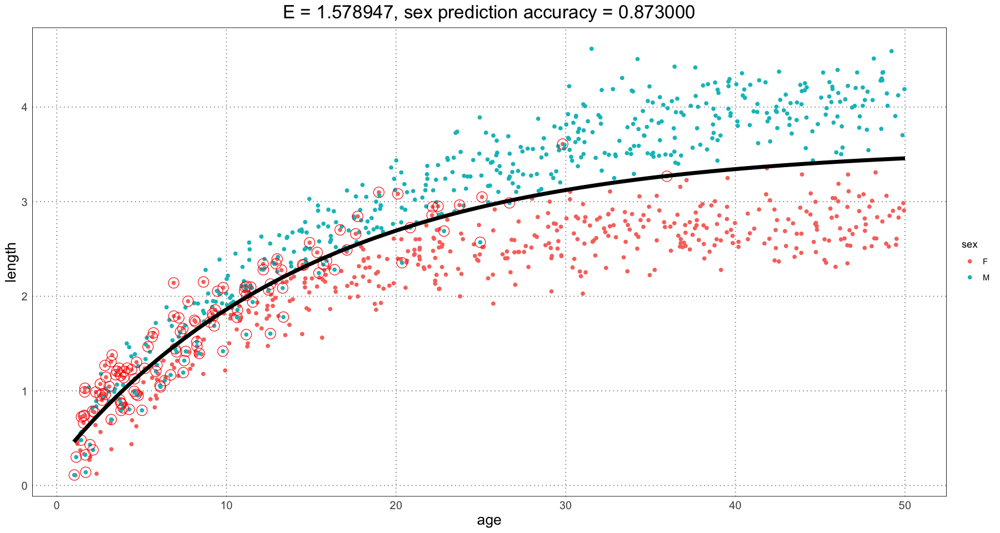

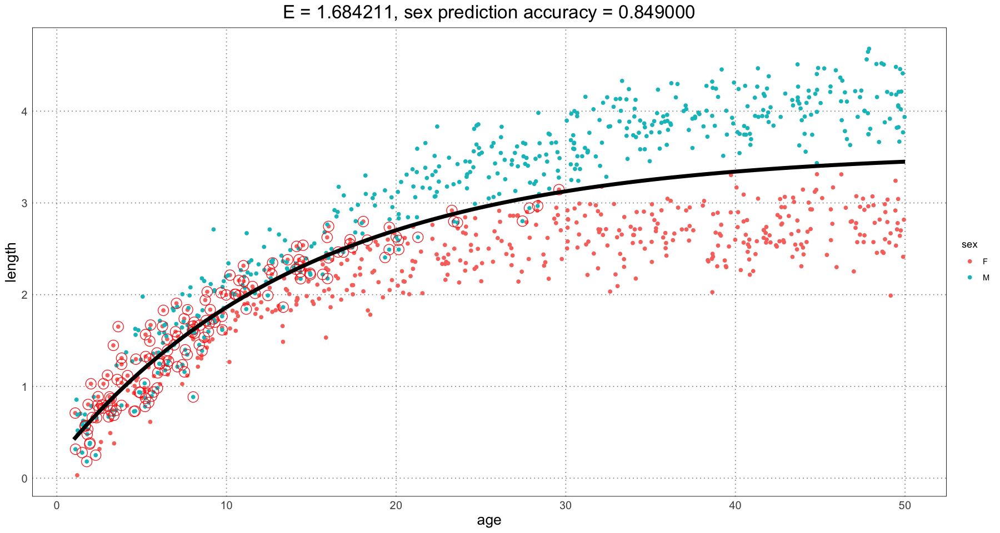

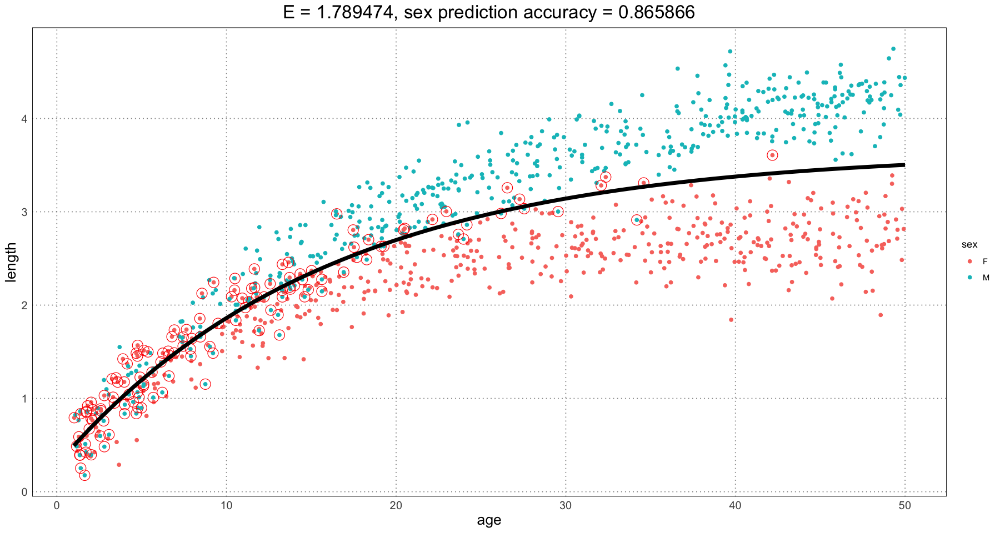

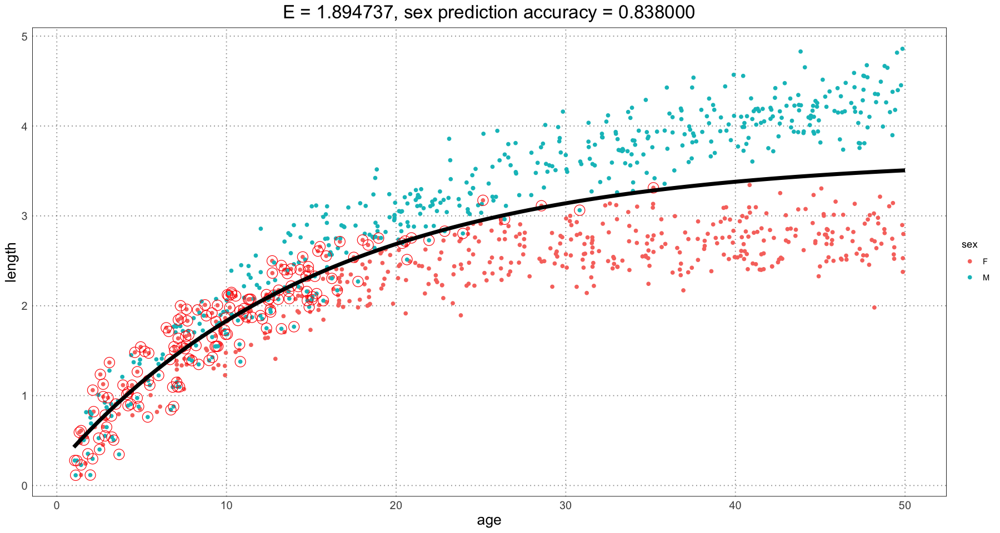

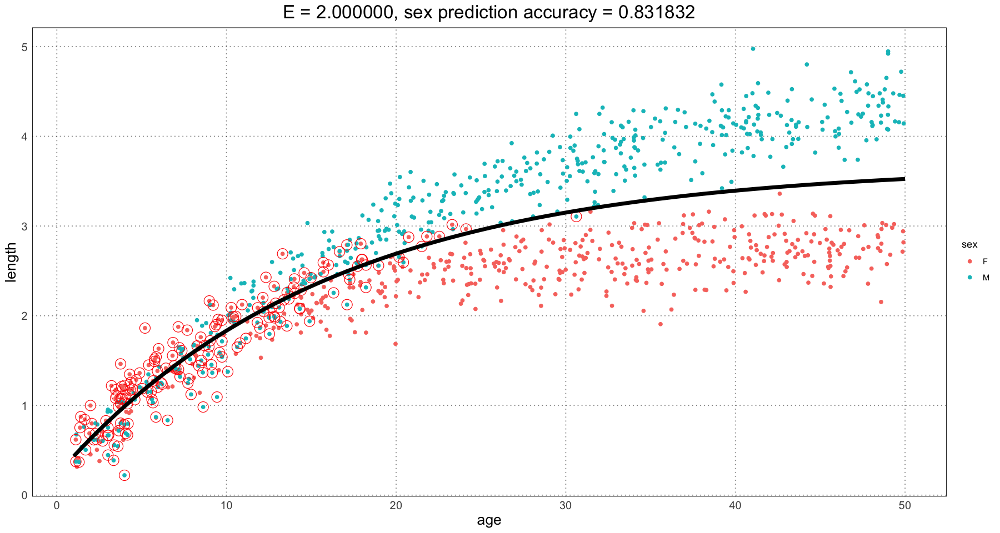

In [113]:
num_samples <- 1e3 / 2
effect_sizes <- seq(0, 2, length.out = 20)
# effect_sizes <- seq(0, 2, length.out = 10)
# effect_sizes <- seq(0, 2, length.out = 5)
# effect_sizes <- c(1)
sex_prediction_accuracy_df <- data.frame(E = numeric(), sex_prediction_accuracy = numeric())
for (E in effect_sizes) {
    # generate the fake males
    fake_male_params <- generate_fake_male_params(E)
    generate_fake_male_sample <- generate_generate_alligator_samples(fake_male_params)
    
    # samples
    female_age <- runif(num_samples, 1, ALLIGATOR_MAX_LIFESPAN)
    female_length <- generate_female_samples(female_age)
    male_age <- runif(num_samples, 1, ALLIGATOR_MAX_LIFESPAN)
    male_length <- generate_fake_male_sample(male_age)
    combined_data <- data.frame(
        age = c(female_age, male_age),
        length = c(female_length, male_length),
        sex = rep(c("F", "M"), each = num_samples)
    )
    combined_data <- subset(combined_data, length > 0)

    population_fit <- generate_curve_fit(combined_data)
    population_params <- coef(population_fit)
    population_params[['sigma']] <- 0

    combined_data$predicted_sex <- generate_predicted_sex(combined_data, fit = population_fit)
    male_data <- subset(combined_data, predicted_sex == "M")
    female_data <- subset(combined_data, predicted_sex == "F")
    sex_prediction_accuracy <- sum(combined_data$sex == combined_data$predicted_sex) / nrow(combined_data)

    curve_ages <- seq(1, ALLIGATOR_MAX_LIFESPAN, length.out = 100)
    curve_length <- generate_generate_alligator_samples(population_params)(curve_ages)
    curve_data <- data.frame(age = curve_ages, length = curve_length)

    p <- ggplot(combined_data, aes(age, length)) +
        geom_point(aes(colour = sex)) +
        geom_point(data = subset(combined_data, sex != predicted_sex), colour = 'red', shape = 21, size = 5) +
        geom_line(data = curve_data, mapping = aes(age, length), linewidth = 2) +
        labs(title = sprintf("E = %f, sex prediction accuracy = %f", E, sex_prediction_accuracy)) +
        custom_theme()
    print(p)

    sex_prediction_accuracy_df <- rbind(
        sex_prediction_accuracy_df,
        data.frame(
            E = E, 
            sex_prediction_accuracy = sex_prediction_accuracy
        )
    )
}

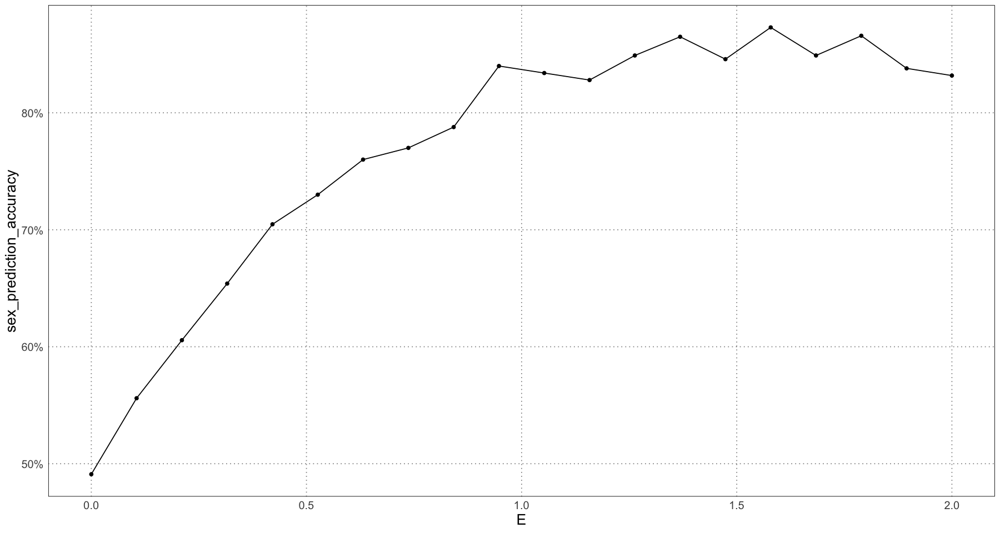

In [114]:
ggplot(sex_prediction_accuracy_df, aes(E, sex_prediction_accuracy)) +
    geom_point() +
    geom_line() +
    scale_y_continuous(labels = scales::percent) +
    custom_theme()

## Bayesian Explanation

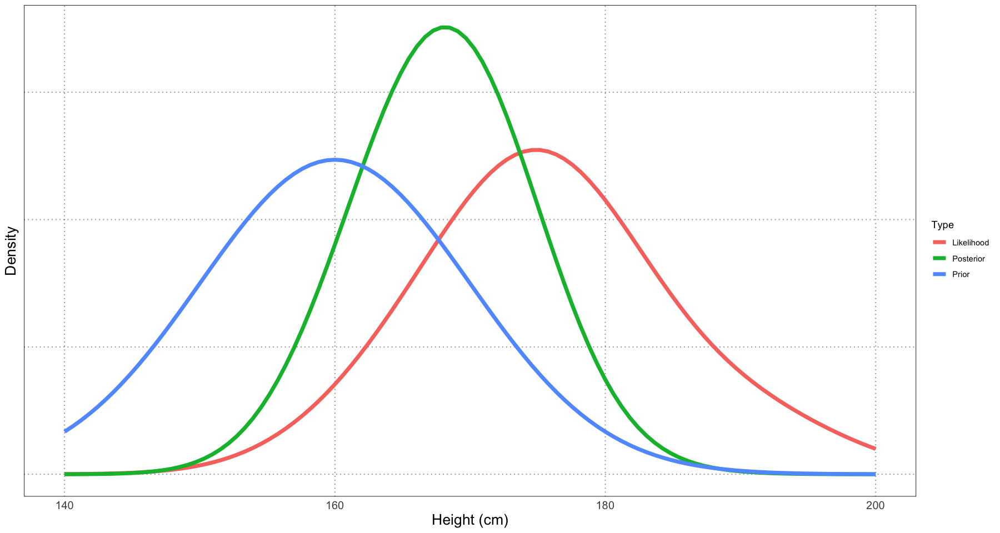

In [14]:
prior_h <- c(160, 10)
actual_h <- c(176, 7)

sample <- rnorm(10, actual_h[1], actual_h[2])

heights <- seq(140, 200, length.out = 100)
prior_likelihood <- dnorm(heights, prior_h[1], prior_h[2])
likelihood_likelihood <- sapply(heights, function(h) sum(dnorm(sample, h, actual_h[2])))
posterior <- prior_likelihood * likelihood_likelihood

prior_likelihood <- prior_likelihood / sum(prior_likelihood)
likelihood_likelihood <- likelihood_likelihood / sum(likelihood_likelihood)
posterior <- posterior / sum(posterior)

df <- data.frame(
    height = rep(heights, 3),
    density = c(prior_likelihood, likelihood_likelihood, posterior),
    type = rep(c("Prior", "Likelihood", "Posterior"), each = length(heights))
)

ggplot(df, aes(height, density, group = type, colour = type)) +
    geom_line(linewidth = 2) +
    custom_theme() +
    labs(x = "Height (cm)", y = "Density", colour = "Type") +
    scale_y_continuous(labels = NULL)
